# Plotting for results

This notebook produces all results plots.
It generates some gap in the data, fill with a method (filter, MDS ...), compute metrics and then makes all relevant plots

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import altair as alt

In [ ]:
from meteo_imp.kalman.results import *
from meteo_imp.data import *
from meteo_imp.utils import *
import pandas as pd
import numpy as np
from pyprojroot import here
import torch
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import SVG, Image

In [ ]:
import vl_convert as vlc
from pyprojroot import here
base_path_img = here("manuscript/Master Thesis - Meteorological time series imputation using Kalman filters - Simone Massaro/images/")
base_path_tbl = here("manuscript/Master Thesis - Meteorological time series imputation using Kalman filters - Simone Massaro/tables/")

def save_plot(plot, path):
    png_data = vlc.vegalite_to_png(vl_spec=plot.to_json(), scale=3)
    with open(base_path_img / (path + ".png"), "wb") as f:
        f.write(png_data)

def show_plot(path): return Image(filename=base_path_img / (path + ".png"))

In [ ]:
reset_seed()
n_rep = 200

In [ ]:
hai = pd.read_parquet(hai_big_path).reindex(columns=var_type.categories)
hai_era = pd.read_parquet(hai_era_big_path)

## Comparison Imputation methods

### Main plot

The gap is a only in the variable that is gap-filled

In [ ]:
hai.columns

Index(['TA', 'SW_IN', 'LW_IN', 'VPD', 'WS', 'PA', 'P', 'SWC', 'TS'], dtype='object')

In [ ]:
base_path = here("analysis/results/trained_14feb")

In [ ]:
def l_model(x): return torch.load(base_path / x)

In [ ]:
models_var = [
    {'var': 'TA',    'model': l_model("TA_specialized_gap_12-336_v2.pickle.pickle")},
    {'var': 'SW_IN', 'model': l_model("SW_IN_specialized_gap_12-336_v2.pickle.pickle")},
    {'var': 'LW_IN', 'model': l_model("LW_IN_specialized_gap_12-336_v1.pickle")},
    {'var': 'VPD',   'model': l_model("VPD_specialized_gap_12-336_v1.pickle")},
    {'var': 'WS',    'model': l_model("WS_specialized_gap_12-336_v3.pickle")},
    {'var': 'PA',    'model': l_model("PA_specialized_gap_12-336_v3.pickle")},
    {'var': 'P',     'model': l_model("P_specialized_gap_12-336_v1.pickle")},
    {'var': 'TS',    'model': l_model("TS_specialized_gap_12-336_v3.pickle")},
    {'var': 'SWC',   'model': l_model("SWC_specialized_gap_12-336_v3_4.pickle")},
]
models_var = pd.DataFrame.from_records(models_var)

In [ ]:
@cache_disk(cache_dir / "the_results")
def get_the_results(n_rep=20):
    comp_Av = ImpComparison(models = models_var, df = hai, control = hai_era, block_len = 446, time_series=False)
    results_Av = comp_Av.compare(gap_len = [12,24, 48, 336], var=list(hai.columns), n_rep=n_rep) 
    return results_Av

results_Av = get_the_results(n_rep*2)

In [ ]:
p = the_plot(results_Av)
save_plot(p, "the_plot")
show_plot("the_plot")

In [ ]:
from itertools import product
import altair as alt

In [ ]:
alt.data_transformers.disable_max_rows() # it is safe to do so as the plots are rendered using vl-convert and then showed as images

DataTransformerRegistry.enable('default')

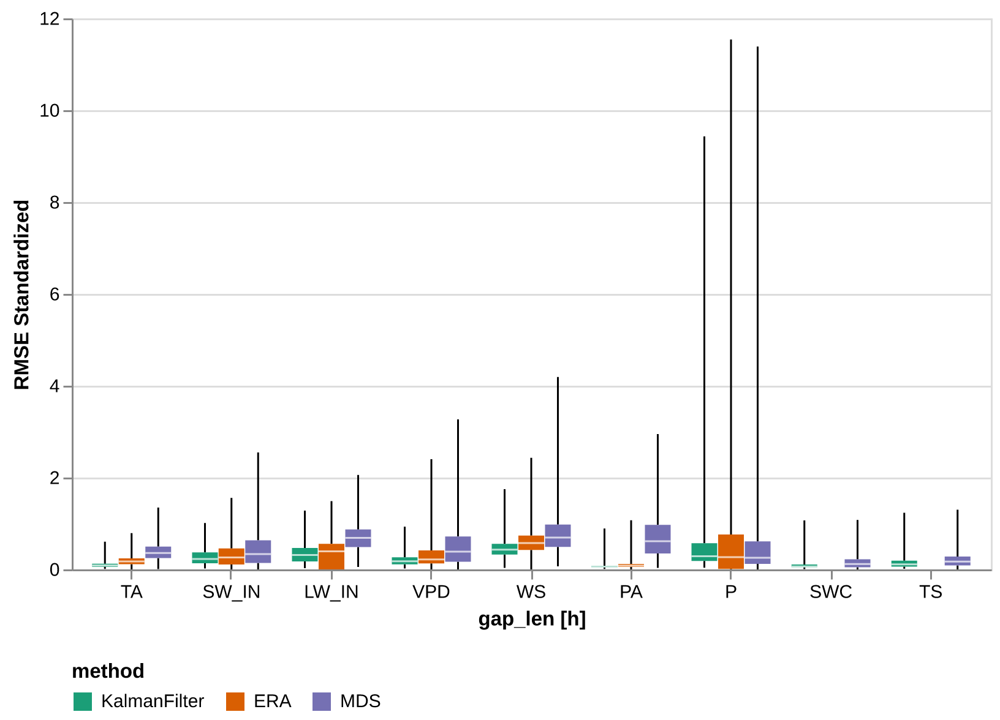

In [ ]:
p = the_plot_stand(results_Av)
save_plot(p, "the_plot_stand")
show_plot("the_plot_stand")

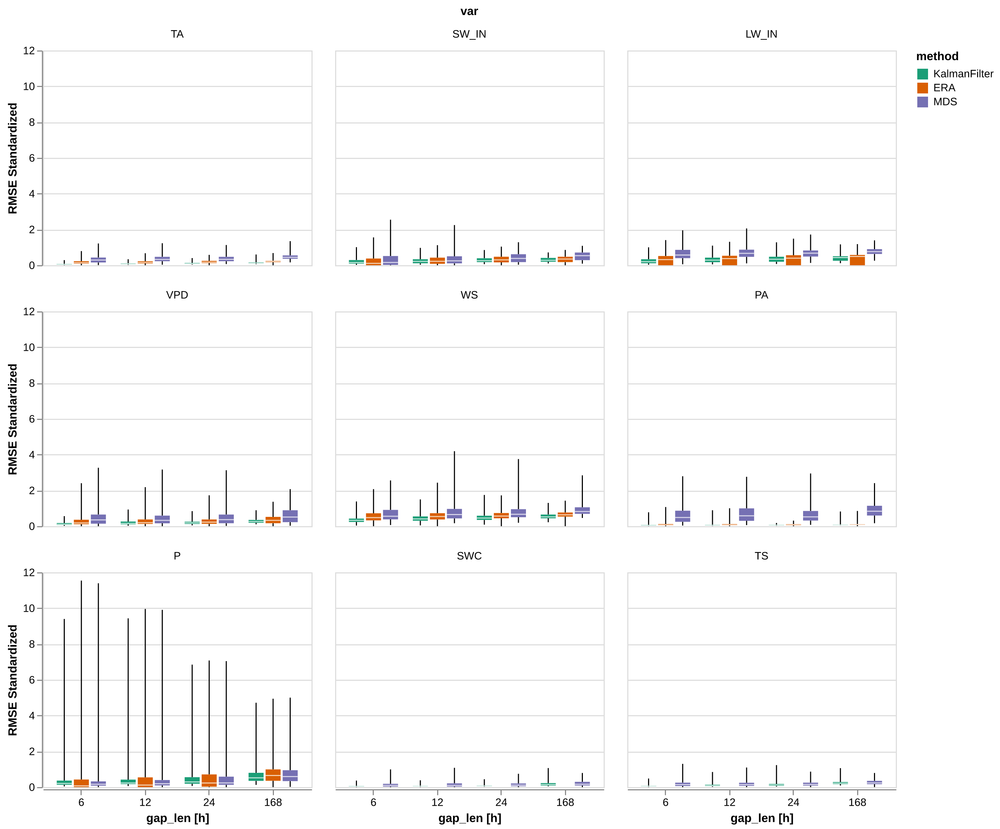

In [ ]:
p = the_plot_stand2(results_Av)
save_plot(p, "the_plot_stand2")
show_plot("the_plot_stand2")

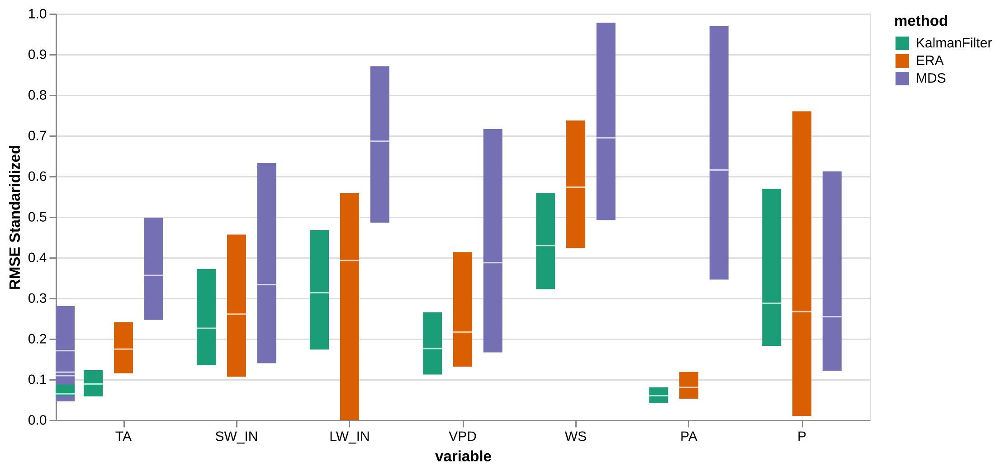

In [ ]:
p = the_plot_stand3(results_Av)
save_plot(p, "the_plot_stand3")
show_plot("the_plot_stand3")

### Table 

In [ ]:
t = the_table(results_Av)
the_table_latex(t, base_path_tbl / "the_table.tex", label="the_table",
                caption="RMSE Comparison imputation methods. The best method for each gap length is highligthed in bold")
t

IndexingError: Too many indexers

In [ ]:
t = the_table(results_Av, 'rmse_stand')
the_table_latex(t, base_path_tbl / "the_table_stand.tex", stand = True, label="the_table_stand", 
                caption = "Comparison of imputation methods using Standardized RMSE. The best method for each gap length is highligthed in bold")
t

KalmanFilter                 ERA                 MDS  \
RMSE                       mean       std      mean       std      mean   
Variable Gap [$h$]                                                        
TA       6.0           0.062956  0.037445  0.170752  0.129165  0.336605   
         12.0          0.087343  0.051866  0.176141  0.110280  0.366882   
         24.0          0.107394  0.057739  0.190548  0.098193  0.363256   
         168.0         0.137265  0.055459  0.222993  0.077295  0.467670   
SW_IN    6.0           0.228639  0.211500  0.258075  0.337345  0.329198   
         12.0          0.252281  0.173291  0.278961  0.248252  0.372192   
         24.0          0.287403  0.154016  0.328315  0.210679  0.431752   
         168.0         0.298965  0.121235  0.336836  0.167903  0.518740   
LW_IN    6.0           0.253615  0.189002  0.320781  0.295226  0.641840   
         12.0          0.321033  0.201289  0.361699  0.294692  0.695209   
         24.0          0.354744  0.194284  0.367025  0.294570  0.682194   
         168.0         0.411605  0.170235  0.398574  0.266428  0.776106   
VPD      6.0           0.135754  0.100476  0.304493  0.359508  0.489321   
         12.0          0.193845  0.132666  0.289157  0.286150  0.467394   
         24.0          0.215665  0.130457  0.296464  0.248496  0.468983   
         168.0         0.288382  0.142477  0.373085  0.245009  0.601302   
WS       6.0           0.358290  0.184984  0.564239  0.343880  0.695902   
         12.0          0.439744  0.196828  0.592998  0.325241  0.758039   
         24.0          0.504141  0.242002  0.614916  0.297488  0.795325   
         168.0         0.569305  0.190593  0.654739  0.201501  0.924447   
PA       6.0           0.058037  0.077181  0.095136  0.114478  0.604861   
         12.0          0.068267  0.069645  0.094379  0.085000  0.710134   
         24.0          0.065748  0.028552  0.088612  0.049389  0.662663   
         168.0         0.081820  0.076622  0.102819  0.082176  0.922980   
P        6.0           0.418972  0.872297  0.434775  1.046150  0.417951   
         12.0          0.434731  0.783906  0.437753  0.924434  0.417631   
         24.0          0.537421  0.826888  0.552752  0.954951  0.544907   
         168.0         0.701252  0.632473  0.793409  0.711163  0.765572   
SWC      6.0           0.056929  0.042892       NaN       NaN  0.142845   
         12.0          0.069053  0.052670       NaN       NaN  0.146299   
         24.0          0.081510  0.059511       NaN       NaN  0.145874   
         168.0         0.170801  0.116399       NaN       NaN  0.209714   
TS       6.0           0.069664  0.057157       NaN       NaN  0.184497   
         12.0          0.108182  0.087728       NaN       NaN  0.186237   
         24.0          0.158512  0.155377       NaN       NaN  0.191972   
         168.0         0.255717  0.149160       NaN       NaN  0.271164   

                              
RMSE                     std  
Variable Gap [$h$]            
TA       6.0        0.238926  
         12.0       0.209070  
         24.0       0.191826  
         168.0      0.152903  
SW_IN    6.0        0.435351  
         12.0       0.366987  
         24.0       0.303488  
         168.0      0.258127  
LW_IN    6.0        0.350440  
         12.0       0.334645  
         24.0       0.282254  
         168.0      0.218526  
VPD      6.0        0.507374  
         12.0       0.457966  
         24.0       0.424225  
         168.0      0.428672  
WS       6.0        0.437991  
         12.0       0.465486  
         24.0       0.464734  
         168.0      0.353211  
PA       6.0        0.477236  
         12.0       0.519842  
         24.0       0.477722  
         168.0      0.450956  
P        6.0        0.999100  
         12.0       0.847320  
         24.0       0.934649  
         168.0      0.703565  
SWC      6.0        0.163933  
         12.0       0.163302  
         24.0       0.131384  
         168.0      0.165552  
TS      

### Timeseries

In [ ]:
@cache_disk(cache_dir / "the_results_ts")
def get_the_results_ts():
    comp_Av = ImpComparison(models = models_var, df = hai, control = hai_era, block_len = 446, time_series=True, rmse=False)
    results_Av = comp_Av.compare(gap_len = [12,24, 336], var=list(hai.columns), n_rep=4) 
    return results_Av

results_ts = get_the_results_ts()

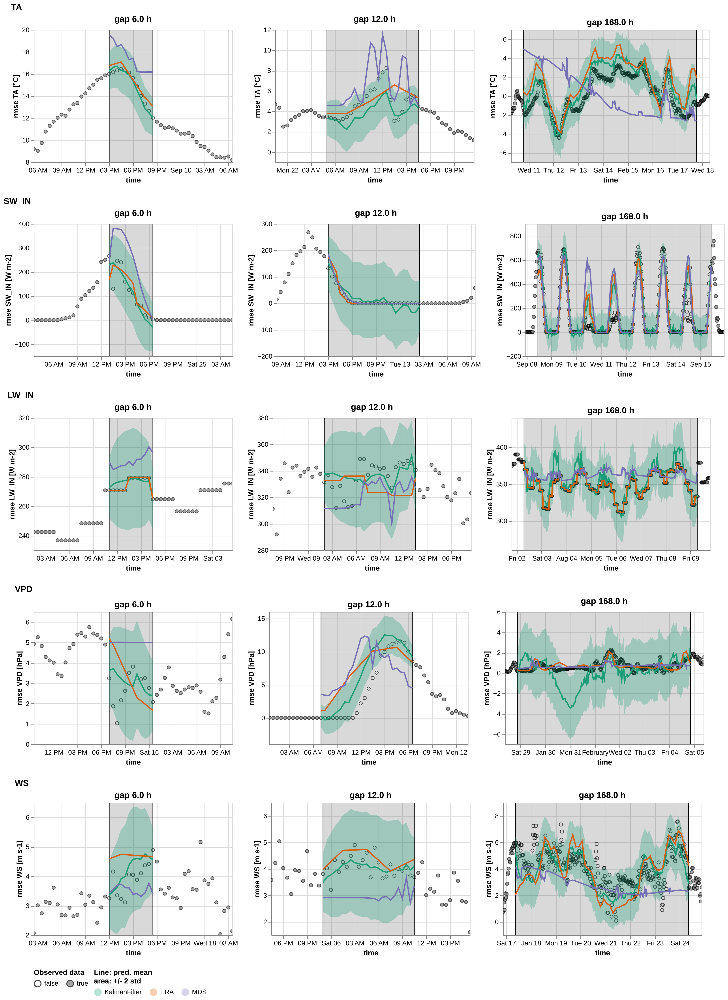

In [ ]:
ts = plot_timeseries(results_ts.query("var in ['TA', 'SW_IN', 'LW_IN', 'VPD', 'WS']"), idx_rep=0)
save_plot(ts, "timeseries_1")
show_plot("timeseries_1")

CPU times: user 2.62 s, sys: 940 µs, total: 2.62 s
Wall time: 2.63 s
CPU times: user 30.2 s, sys: 10.8 s, total: 41.1 s
Wall time: 40.6 s


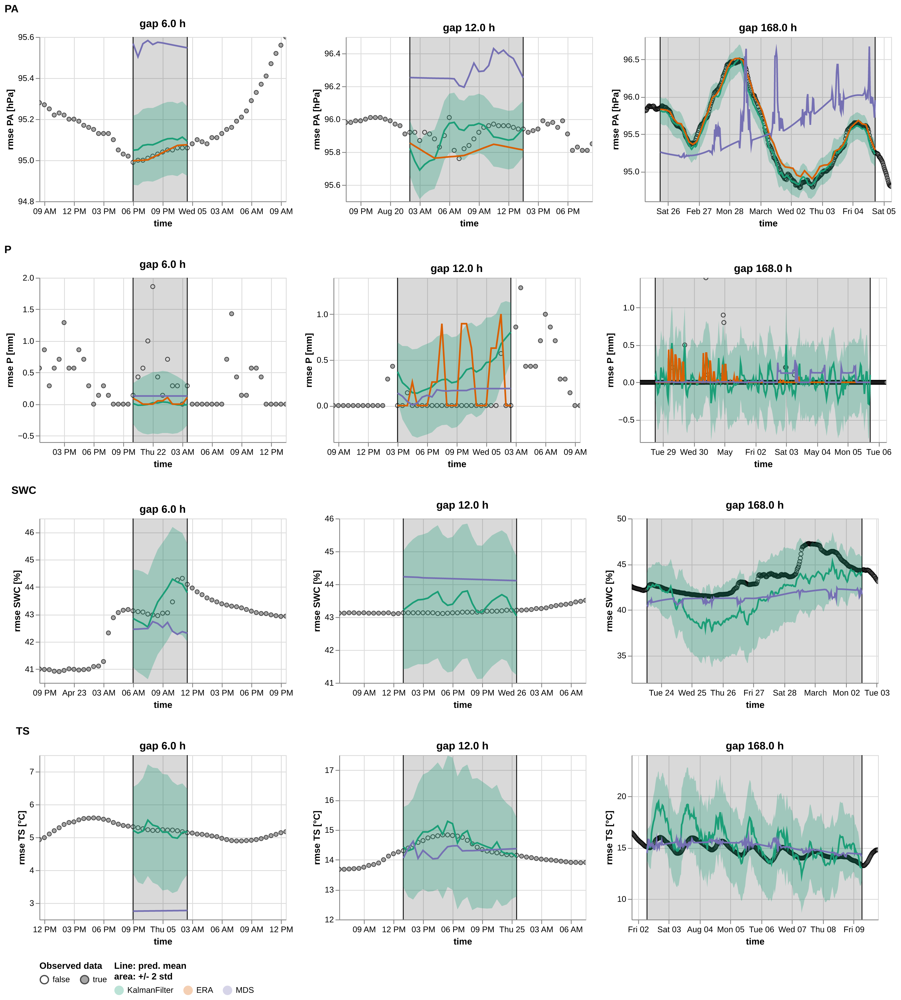

In [ ]:
%time ts = plot_timeseries(results_ts.query("var in ['PA', 'P', 'TS', 'SWC']"), idx_rep=0)
%time save_plot(ts, "timeseries_2")
show_plot("timeseries_2")

In [ ]:
from tqdm.auto import tqdm

In [ ]:
results_ts.idx_rep.unique()

array([0, 1, 2, 3])

In [ ]:
# @cache_disk(cache_dir / "ts_plot")
def plot_additional_ts():
    for idx in tqdm(results_ts.idx_rep.unique()):
        if idx == 0: continue # skip first plot as is done above
        ts1 = plot_timeseries(results_ts.query("var in ['TA', 'SW_IN', 'LW_IN', 'VPD', 'WS']"), idx_rep=idx)
        save_plot(ts1, f"timeseries_1_{idx}")
        ts2 = plot_timeseries(results_ts.query("var in ['PA', 'P', 'TS', 'SWC']"), idx_rep=idx)
        save_plot(ts2, f"timeseries_2_{idx}")        

In [ ]:
plot_additional_ts()

  0%|          | 0/4 [00:00<?, ?it/s]

## Kalman Filter analysis

### Gap len

In [ ]:
@cache_disk("gap_len")
def get_g_len(n_rep=n_rep):
    return ImpComparison(models_var, hai, hai_era, block_len=48*7+100).compare(gap_len = [3,6,12,24,48,48*2, 48*3, 48*7], var=list(hai.columns), n_rep=n_rep)
gap_len = get_g_len(30)

  0%|          | 0/72 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

In [ ]:
gap_len

In [ ]:
p = plot_gap_len(gap_len, hai, hai_era)
save_plot(p, "gap_len")
p

In [ ]:
t = table_gap_len(gap_len)
table_gap_len_latex(t, base_path_tbl / "gap_len.tex", label="gap_len",
                caption="RMSE Comparison Kalman filter for different gap lengths")
t

,Gap [$h$],1.5,3.0,6.0,12.0,24.0,48.0,72.0,168.0
Variable,RMSE,,,,,,,,
TA,mean,1.489046,1.899525,1.550939,1.588637,1.836533,1.970321,1.931623,2.192952
SW_IN,mean,36.767868,31.913987,32.459420,53.345348,74.208547,80.852271,73.141580,69.275739
LW_IN,mean,13.179088,20.130178,18.386873,16.125218,18.887488,21.684297,21.158696,21.956839
VPD,mean,1.311774,1.245910,1.393659,1.224966,1.826465,1.364243,1.734447,2.179153
WS,mean,0.783639,0.725142,0.828063,1.062845,1.135491,1.006807,1.085403,1.249310
PA,mean,0.197764,0.217956,0.227877,0.253720,0.254219,0.257215,0.252200,0.336213
P,mean,0.074846,0.066700,0.175040,0.185111,0.152052,0.193864,0.185676,0.215047
SWC,mean,0.733122,0.947987,0.890558,0.777283,0.882779,1.145619,1.408020,1.790438
TS,mean,0.633190,0.599646,0.623030,0.770655,0.961654,1.059902,1.365203,1.476559


In [ ]:
from meteo_imp.kalman.results import _get_era_rmse, _plot_gap_len

In [ ]:
data = prep_df(agg_gap_len(gap_len))
data = pd.merge(data, _get_era_rmse(hai, hai_era), on='var', how='left')
data = data[data.method == 'KalmanFilter']
data = data.astype({'gap_len': float})

In [ ]:
data

In [ ]:
data.era_rmse = 3

In [ ]:
data.query("var == 'SWC'")

In [ ]:
_plot_gap_len(data.query("var == 'SWC'"), "")

In [ ]:
p

### Control

In [ ]:
models_nc = models_var.copy()

In [ ]:
models_nc.model = l_model("1_gap_varying_336_no_control_v1.pickle") 
models_nc['type'] = 'No Control'

In [ ]:
models_nc = pd.concat([models_nc, models_var.assign(type = 'Control')])

In [ ]:
@cache_disk("use_control")
def get_control(n_rep=n_rep):
    
    kcomp_control = KalmanImpComparison(models_nc, hai, hai_era, block_len=100+48*7)

    k_results_control = kcomp_control.compare(n_rep =n_rep, gap_len = [12, 24, 48, 48*7], var = list(hai.columns))
    
    return k_results_control

In [ ]:
k_results_control = get_control(100)

In [ ]:
p = plot_compare(k_results_control, 'type', scale_domain=["Control", "No Control"])
save_plot(p, "use_control")
p

alt.VConcatChart(...)

In [ ]:
from functools import partial

In [ ]:
t = table_compare(k_results_control, 'type')
table_compare_latex(t, base_path_tbl / "control.tex", label="control",
                caption="RMSE Comparison Kalman filter with and without control variable. The best result for each for each gap length is highligthed in bold")
t

type               No Control             Control                    
RMSE Standardized        mean       std      mean       std     diff.
Variable Gap [$h$]                                                   
TA       6.0         0.114043  0.070764  0.062731  0.037398  0.051312
         12.0        0.182207  0.097522  0.097195  0.074300  0.085012
         24.0        0.259053  0.163428  0.116026  0.086046  0.143027
         168.0       0.271504  0.157209  0.139142  0.085553  0.132362
SW_IN    6.0         0.340576  0.277375  0.237890  0.237392  0.102687
         12.0        0.549056  0.330001  0.243710  0.177607  0.305346
         24.0        0.594778  0.218154  0.282943  0.135989  0.311835
         168.0       0.636376  0.211599  0.297144  0.122140  0.339231
LW_IN    6.0         0.344179  0.210288  0.308080  0.229352  0.036099
         12.0        0.517863  0.236583  0.385214  0.227131  0.132649
         24.0        0.542773  0.225683  0.404170  0.176307  0.138603
         168.0       0.637750  0.181919  0.430816  0.178671  0.206934
VPD      6.0         0.178481  0.162497  0.143149  0.113808  0.035332
         12.0        0.273428  0.160699  0.195633  0.125523  0.077795
         24.0        0.375492  0.228009  0.250080  0.185818  0.125412
         168.0       0.523817  0.566381  0.287225  0.153175  0.236592
WS       6.0         0.468733  0.257204  0.338650  0.197551  0.130082
         12.0        0.660776  0.403980  0.455448  0.220032  0.205328
         24.0        0.782202  0.363301  0.463176  0.173345  0.319025
         168.0       0.897525  0.333656  0.585610  0.208745  0.311915
PA       6.0         0.153917  0.102660  0.056844  0.031284  0.097073
         12.0        0.356710  0.227798  0.061886  0.028534  0.294824
         24.0        0.578382  0.336423  0.066928  0.033343  0.511454
         168.0       0.959275  0.416790  0.087659  0.057976  0.871616
P        6.0         0.376429  0.964118  0.461650  0.767784  0.085220
         12.0        0.671303  1.053990  0.425776  0.548582  0.245527
         24.0        0.467940  0.537627  0.701613  1.201724  0.233673
         168.0       0.719619  0.578157  0.782142  0.695205  0.062524
SWC      6.0         0.120123  0.080567  0.053796  0.038043  0.066327
         12.0        0.281477  0.168667  0.058665  0.033908  0.222812
         24.0        0.513198  0.334854  0.070566  0.046434  0.442632
         168.0       0.774333  0.319195  0.149323  0.075460  0.625010
TS       6.0         0.131742  0.102301  0.065595  0.073311  0.066147
         12.0        0.201143  0.131245  0.091053  0.052662  0.110089
         24.0        0.280694  0.168537  0.169935  0.149155  0.110759
         168.0       0.355551  0.195889  0.290285  0.188009  0.065266

### Gap in Other variables

In [ ]:
models_gap_all = models_var.copy()

In [ ]:
models_gap_all.model = l_model("All_gap_all_30_v1.pickle") 
models_gap_all['Gap'] = 'All variables'
models_gap_all['gap_single_var'] = False

In [ ]:
models_gap_all = pd.concat([models_gap_all, models_var.assign(Gap = 'Only one var', gap_single_var = True)])

In [ ]:
@cache_disk("multi_gap")
def get_multi_gap(n_rep):
    kcomp_single = KalmanImpComparison(models_gap_all, hai, hai_era, block_len=120)

    return kcomp_single.compare(n_rep =n_rep, gap_len = [6, 12, 24, 30], var = list(hai.columns))

In [ ]:
k_results_single = get_multi_gap(n_rep)

In [ ]:
p = plot_compare(k_results_single, "Gap", scale_domain=["Only one var", "All variables"])
save_plot(p, "gap_single_var")
p

alt.VConcatChart(...)

In [ ]:
t = table_compare(k_results_single, 'Gap')
table_compare_latex(t, base_path_tbl / "gap_single_var.tex")
t

Gap                Only one var           All variables                    
RMSE Standardized          mean       std          mean       std     diff.
Variable Gap [$h$]                                                         
TA       3.0           0.047826  0.026217      0.047091  0.032303  0.000734
         6.0           0.067102  0.037315      0.079718  0.053687  0.012615
         12.0          0.090367  0.047885      0.114501  0.071407  0.024134
         15.0          0.097701  0.056815      0.130359  0.081897  0.032658
SW_IN    3.0           0.205119  0.230211      0.229101  0.295796  0.023982
         6.0           0.235795  0.215039      0.282418  0.313901  0.046623
         12.0          0.259496  0.196615      0.259349  0.250456  0.000147
         15.0          0.259034  0.179896      0.236803  0.190739  0.022230
LW_IN    3.0           0.200960  0.196623      0.214080  0.195216  0.013120
         6.0           0.258865  0.202185      0.283466  0.187237  0.024601
         12.0          0.356233  0.225200      0.353132  0.219568  0.003102
         15.0          0.365159  0.232241      0.359804  0.218060  0.005354
VPD      3.0           0.102910  0.086149      0.122344  0.123296  0.019433
         6.0           0.137758  0.123173      0.178410  0.155617  0.040652
         12.0          0.175459  0.117481      0.220276  0.167104  0.044816
         15.0          0.206149  0.131534      0.256126  0.206628  0.049976
WS       3.0           0.290884  0.178494      0.316850  0.159537  0.025966
         6.0           0.372105  0.185916      0.385834  0.252795  0.013729
         12.0          0.430184  0.240616      0.464345  0.220158  0.034161
         15.0          0.452752  0.207843      0.498879  0.257853  0.046127
PA       3.0           0.040372  0.024078      0.034010  0.023467  0.006362
         6.0           0.050795  0.033720      0.047581  0.031750  0.003214
         12.0          0.063930  0.046619      0.064708  0.050742  0.000779
         15.0          0.063437  0.030028      0.061685  0.040497  0.001752
P        3.0           0.368878  0.802978      0.295534  0.407557  0.073344
         6.0           0.624175  1.487370      0.379487  0.964498  0.244687
         12.0          0.456400  0.759322      0.517194  1.119023  0.060794
         15.0          0.565886  1.221717      0.430597  0.674907  0.135289
SWC      3.0           0.044412  0.034129      0.020442  0.032439  0.023970
         6.0           0.054879  0.049421      0.026728  0.037589  0.028151
         12.0          0.066338  0.053403      0.034255  0.041594  0.032083
         15.0          0.071361  0.055324      0.037934  0.047717  0.033428
TS       3.0           0.047712  0.030480      0.032752  0.031183  0.014961
         6.0           0.067612  0.050994      0.054916  0.046649  0.012696
         12.0          0.099139  0.073299      0.099991  0.125457  0.000853
         15.0          0.120867  0.113442      0.118036  0.131332  0.002830

### Generic vs Specialized

In [ ]:
models_generic = models_var.copy()

In [ ]:
models_generic.model = l_model("1_gap_varying_12-336_v1.pickle") 
models_generic['type'] = 'Generic'

In [ ]:
models_generic

,var,model,type
0,TA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
1,SW_IN,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
2,LW_IN,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
3,VPD,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
4,WS,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
5,PA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
6,P,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
7,TS,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
8,SWC,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic


In [ ]:
models_generic.model.map(id)

0    140051155501696
1    140051155501696
2    140051155501696
3    140051155501696
4    140051155501696
5    140051155501696
6    140051155501696
7    140051155501696
8    140051155501696
Name: model, dtype: int64

In [ ]:
models_var['type'] = 'Finetuned one var'

In [ ]:
models_var

,var,model,type
0,TA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
1,SW_IN,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
2,LW_IN,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
3,VPD,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
4,WS,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
5,PA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
6,P,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
7,TS,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var
8,SWC,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var


In [ ]:
models_gen_vs_spec = pd.concat([models_generic, models_var])

In [ ]:
models_gen_vs_spec

,var,model,type
0,TA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
1,SW_IN,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
2,LW_IN,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
3,VPD,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
4,WS,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
5,PA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
6,P,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
7,TS,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
8,SWC,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Generic
0,TA,"Kalman Filter\n N dim obs: 9,\n N dim state: 18,\n N dim contr: 14",Finetuned one var


In [ ]:
@cache_disk("generic")
def get_generic(n_rep=n_rep):

    comp_generic = KalmanImpComparison(models_gen_vs_spec, hai, hai_era, block_len=100+48*7)

    return comp_generic.compare(n_rep =n_rep, gap_len = [12, 24, 48, 48*7], var = list(hai.columns))
k_results_generic = get_generic(n_rep//2)

In [ ]:
p = plot_compare(k_results_generic, 'type', scale_domain=["Finetuned one var", "Generic"])
save_plot(p, "generic")
p

alt.VConcatChart(...)

In [ ]:
t = table_compare(k_results_generic, 'type')
table_compare_latex(t, base_path_tbl / "generic.tex")
t

type                 Generic           Finetuned one var                    
RMSE Standardized        std      mean               std      mean     diff.
Variable Gap [$h$]                                                          
TA       6.0        0.098587  0.161057          0.045996  0.065117  0.095940
         12.0       0.111974  0.209980          0.042294  0.081207  0.128774
         24.0       0.106311  0.225030          0.060710  0.112296  0.112734
         168.0      0.099402  0.273944          0.060049  0.135647  0.138296
SW_IN    6.0        0.233653  0.301904          0.225413  0.260296  0.041608
         12.0       0.220423  0.373898          0.199979  0.274738  0.099160
         24.0       0.185092  0.420102          0.148273  0.285312  0.134790
         168.0      0.146282  0.452687          0.115343  0.294264  0.158423
LW_IN    6.0        0.216164  0.376444          0.219029  0.329979  0.046465
         12.0       0.331103  0.477034          0.227034  0.365241  0.111793
         24.0       0.195781  0.531470          0.199575  0.370111  0.161360
         168.0      0.153816  0.545469          0.162494  0.396118  0.149351
VPD      6.0        0.121899  0.222909          0.072202  0.126454  0.096455
         12.0       0.117362  0.249992          0.128614  0.184168  0.065824
         24.0       0.131592  0.326970          0.156446  0.268647  0.058323
         168.0      0.150745  0.390656          0.148199  0.272850  0.117806
WS       6.0        0.271664  0.417109          0.183606  0.362587  0.054522
         12.0       0.291304  0.589655          0.188738  0.409404  0.180251
         24.0       0.221980  0.598381          0.254438  0.537054  0.061326
         168.0      0.242703  0.778124          0.197102  0.572614  0.205510
PA       6.0        0.077089  0.110375          0.031283  0.049204  0.061171
         12.0       0.088562  0.164312          0.030986  0.064819  0.099493
         24.0       0.090332  0.195453          0.035165  0.070478  0.124975
         168.0      0.085372  0.219453          0.044787  0.077915  0.141538
P        6.0        0.633675  0.325220          0.636068  0.370500  0.045280
         12.0       0.873143  0.562748          0.769335  0.481885  0.080863
         24.0       0.905952  0.531054          0.678331  0.522318  0.008737
         168.0      0.730855  0.735398          0.502409  0.633064  0.102334
SWC      6.0        0.125558  0.211804          0.037598  0.054555  0.157249
         12.0       0.200305  0.336517          0.036541  0.062800  0.273717
         24.0       0.289630  0.585521          0.069892  0.090148  0.495372
         168.0      0.344684  0.781560          0.103848  0.180183  0.601377
TS       6.0        0.116536  0.156436          0.064870  0.075934  0.080503
         12.0       0.130427  0.238408          0.077565  0.099618  0.138790
         24.0       0.176136  0.292181          0.106498  0.150343  0.141839
         168.0      0.174198  0.377309          0.154403  0.257194  0.120116

## Fluxnet

In [ ]:
import polars as pl
from fastai.vision.data import get_grid

### Correlation

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import statsmodels.api as sm

In [ ]:
def auto_corr_df(data, nlags=48):
    autocorr = {}
    for col in data.columns:
        autocorr[col] = sm.tsa.acf(data[col], nlags=nlags)
    return pd.DataFrame(autocorr)

In [ ]:
auto_corr = auto_corr_df(hai).T[[1,3,6,12,24,48]]
auto_corr.columns = auto_corr.columns /2

In [ ]:
axes = get_grid(2,1,2, figsize=(15,8))
sns.heatmap(hai.corr(), annot=True,     vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200), ax=axes[0], square=True, cbar=False)
sns.heatmap(auto_corr, annot=True,     vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200), square=True, ax=axes[1])
axes[1].set(ylabel="Variable", xlabel="Shift [h]", title="Temporal Autocorrelation")
axes[0].set(xlabel="Variable", ylabel="Variable", title="Correlation");
plt.tight_layout()
plt.savefig(base_path_img / "correlation.png")

### Gap distribution

In [ ]:
out_dir = here("../fluxnet/gap_stat")

In [ ]:
site_info = pl.read_parquet(out_dir / "../site_info.parquet").select([
    pl.col("start").cast(pl.Utf8).str.strptime(pl.Datetime, "%Y%m%d%H%M"),
    pl.col("end").cast(pl.Utf8).str.strptime(pl.Datetime, "%Y%m%d%H%M"),
    pl.col("site").cast(pl.Categorical).sort()
])

In [ ]:
def duration_n_obs(duration):
    "converts a duration into a n of fluxnet observations"
    return abs(int(duration.total_seconds() / (30 * 60)))

In [ ]:
files = out_dir.ls()
files.sort() # need to sort to match the site_info
sites = []
for i, path in enumerate(files):
    sites.append(pl.scan_parquet(path).with_columns([
        pl.lit(site_info[i, "site"]).alias("site"),
        pl.lit(duration_n_obs(site_info[i, "start"] -  site_info[i, "end"])).alias("total_obs"),
        pl.col("TIMESTAMP_END").cast(pl.Utf8).str.strptime(pl.Datetime, "%Y%m%d%H%M").alias("end"),
    ]).drop("TIMESTAMP_END"))

gap_stat = pl.concat(sites)

In [ ]:
def plot_var_dist(var, small=False, ax=None):
    if ax is None: ax = get_grid(1)[0]
    ta_gaps = gap_stat.filter(
        (pl.col("variable") == var)
    ).filter(
        pl.col("gap_len") < 200 if small else True
    ).with_column(pl.col("gap_len") / (24 *2 * 7)).collect().to_pandas().hist("gap_len", bins=50, ax=ax)
    ax.set_title(f"{var} - { 'gaps < 200' if small else 'all gaps'}")
    if not small: ax.set_yscale('log')
    ax.set_xlabel("gap length (weeks)")
    ax.set_ylabel(f"{'Log' if not small else ''} n gaps")
    # plt.xscale('log') 

In [ ]:
plot_var_dist('TA_F_QC')

In [ ]:
color_map = dict(zip(scale_meteo.domain, list(sns.color_palette('Set2', n_colors=len(hai.columns)).as_hex())))

In [ ]:
qc_map = {
    'TA': 'TA_F_QC',
    'SW_IN': 'SW_IN_F_QC',
    'LW_IN': 'LW_IN_F_QC',
    'VPD': 'VPD_F_QC',
    'WS': 'WS_F_QC',
    'PA': 'PA_F_QC',
    'P': 'P_F_QC',
    'TS': 'TS_F_MDS_1_QC',
    'SWC': 'SWC_F_MDS_1_QC',
}

In [ ]:
def pl_in(col, values):
    expr = False
    for val in values:
        expr |= pl.col(col) == val
    return expr

In [ ]:
gap_stat.filter(pl_in('variable', qc_map.values())
               ).with_columns([
    pl.when(pl.col("gap_len") < 48*7).then(True).otherwise(False).alias("short"),
    pl.count().alias("total"),
    pl.count().alias("total len"),
]).groupby("short").agg([
    (pl.col("gap_len").count() / pl.col("total")).alias("frac_num"),
    (pl.col("gap_len").sum() / pl.col("total len")).alias("frac_len")
]).collect()

In [ ]:
def plot_var_dist_small(var, ax=None, small=True):
    if ax is None: ax = get_grid(1)[0]
    
    color = color_map[var]
    var_qc = qc_map[var]
    ta_gaps = gap_stat.filter(
        (pl.col("variable") == var_qc)
    ).filter(
        pl.col("gap_len") < (24 * 2 *7) if small else True 
    ).with_column(pl.col("gap_len") / (2 if small else 48 * 7)
                 ).collect().to_pandas().hist("gap_len", bins=50, ax=ax, edgecolor="white", color=color)
    ax.set_title(f"{var} - { 'gap length <  1 week' if small else 'all gaps'}")
    ax.set_xlabel(f"gap length ({ 'hour' if small else 'week'})")
    ax.set_ylabel(f"Log n gaps")
    ax.set_yscale('log') 

In [ ]:
vars = gap_stat.select(pl.col("variable").unique()).collect()

In [ ]:
vars.filter(pl.col("variable").str.contains("TA"))

In [ ]:
for ax, var in zip(get_grid(9,3,3, figsize=(15,12), sharey=False), list(var_type.categories)):
    plot_var_dist_small(var, ax=ax)
plt.savefig(base_path_img / "gap_len_dist_small.png")

In [ ]:
for ax, var in zip(get_grid(9,3,3, figsize=(15,12), sharey=False), list(var_type.categories)):
    plot_var_dist_small(var, ax=ax, small=False)
plt.savefig(base_path_img / "gap_len_dist.png")

methods colors

In [ ]:
print(sns.color_palette('Dark2').as_hex())